In [1]:
%matplotlib inline
import sys
import numpy as np
import astropy.coordinates as coord
import astropy.units as u
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.patches import Polygon
import matplotlib.colors as colors
import matplotlib.cm as cmx
import pandas as pd

In [2]:
# generate list of fields for WINTER
# generate grid of 1x1 degree fields for WINTER
# NOTE, not exactly 1x1, TODO: fix
#    we want a few arc-minute overlap between fields
#        ...how to calculate field corners?
plot1 = 0
plot2 = 1
rapoints = []
decpoints = []
ra1points, ra2points, ra3points, ra4points = [], [], [], []
dec1points, dec2points, dec3points, dec4points = [], [], [], []
field_size = 1 #degree on sky
half_size = field_size / 2
num_decs = 180 / field_size
print(num_decs, type(num_decs))
decs = np.linspace(90,-89,int(num_decs))
decsB = decs - half_size
decsT = decs + half_size
for i in range(len(decs)):
    circ = np.cos(decs[i]*np.pi/180.)
    radiffB = half_size/np.cos(decsB[i]*np.pi/180)
    radiffT = half_size/np.cos(decsT[i]*np.pi/180)
    numpoints = int(360/field_size*circ+1)
    ras = np.linspace(0,360,numpoints)[:-1]
    #print(ras)
    ra1s = ras - radiffB
    ra2s = ras + radiffB
    ra4s = ras - radiffT
    ra3s = ras + radiffT
    ra1points = np.append(ra1points,ra1s)
    ra2points = np.append(ra2points,ra2s)
    ra3points = np.append(ra3points,ra3s)
    ra4points = np.append(ra4points,ra4s)
    dec1points = np.append(dec1points,np.ones(numpoints-1)*decsB[i])
    dec2points = np.append(dec2points,np.ones(numpoints-1)*decsB[i])
    dec3points = np.append(dec3points,np.ones(numpoints-1)*decsT[i])
    dec4points = np.append(dec4points,np.ones(numpoints-1)*decsT[i])
    decpoints = np.append(decpoints,np.ones(numpoints-1)*decs[i])
    rapoints = np.append(rapoints,ras)

print('Grid contains %d fields' % (len(rapoints)))
ra = coord.Angle(rapoints*u.degree)
#print ra.radian
#wrap = 180.
wrap = 360.
ra = ra.wrap_at(wrap*u.degree)
#print ra.radian
dec = coord.Angle(decpoints*u.degree)

if plot1:
    fig1 = plt.figure(figsize=(8,6))
    ax1 = fig1.add_subplot(111, projection="mollweide")
    ax1.scatter(ra.radian, dec.radian, 0.01)

ra1points = coord.Angle(ra1points*u.degree)
ra1points = ra1points.wrap_at(wrap*u.degree)
dec1points = coord.Angle(dec1points*u.degree)

ra2points = coord.Angle(ra2points*u.degree)
ra2points = ra2points.wrap_at(wrap*u.degree)
dec2points = coord.Angle(dec2points*u.degree)

ra3points = coord.Angle(ra3points*u.degree)
ra3points = ra3points.wrap_at(wrap*u.degree)
dec3points = coord.Angle(dec3points*u.degree)

ra4points = coord.Angle(ra4points*u.degree)
ra4points = ra4points.wrap_at(wrap*u.degree)
dec4points = coord.Angle(dec4points*u.degree)


180.0 <class 'float'>
Grid contains 41166 fields


In [13]:
rand_array = np.random.choice(41165, 100)

[38017 34201 26734 12151 15840 40135 12144  1691 20364 22177 11715 28879
 12428 34419  6837 22301 27355 26202 38782 28796 37430 15135 20919 36236
  7645 38675 34712 39814 22544   121  1823 26922 38571 13923  7989 19751
    98  7709  6872 40451  6936  5267 25289 33578  8250 29360  3582  1464
 32375  9494  3002 19715 38630 23759 28941 33016 22819  3021 20760  2668
 36073 35843 19004 13820 32207 24220 23441 30268 18981 32946 27160 30902
 11747  9456 26509 33903 28518 31119  3350  5684  4452 16278  8411 38669
 14772 11478 16183  3824 25792 32979 35159 29379 25483 14133  9484 10552
 30218  9788  2559 27758]


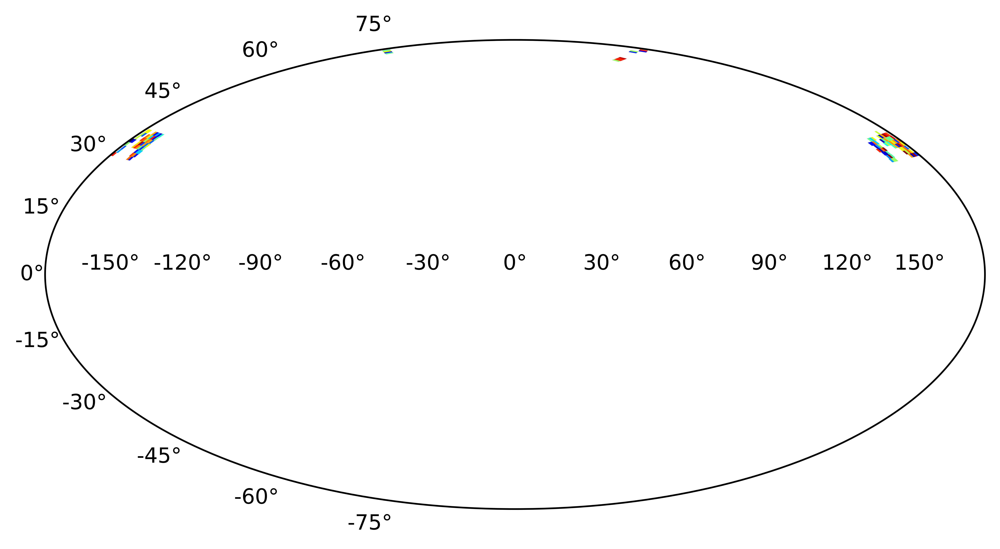

In [122]:
if plot2:
    fig2 = plt.figure(figsize=(8,6), dpi=1200)
    ax2 = fig2.add_subplot(111, projection="hammer")

    #jet = colors.Colormap('jet')
    jet = plt.get_cmap('jet') 
    cNorm  = colors.Normalize(vmin=0,vmax=len(ra))
    scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)
    #print scalarMap.get_clim()

    for i in field_arr:
        #print [ra1points[i].radian,ra2points[i].radian,ra3points[i].radian,ra4points[i].radian],[dec1points[i].radian,dec2points[i].radian,dec3points[i].radian,dec4points[i].radian]
        #colorVal = scalarMap.to_rgba(i)
        if (np.abs(ra1points[i].wrap_at(180*u.deg).radian-ra2points[i].wrap_at(180*u.deg).radian)<30*np.pi/180.) \
        & (np.abs(ra1points[i].wrap_at(180*u.deg).radian-ra3points[i].wrap_at(180*u.deg).radian)<30*np.pi/180.) & (np.abs(ra1points[i].wrap_at(180*u.deg).radian-ra4points[i].wrap_at(180*u.deg).radian)<30*np.pi/180.) : 
            colorVal = scalarMap.to_rgba(np.random.randint(0,len(ra)))
            ax2.fill([ra1points[i].wrap_at(180*u.deg).radian,ra2points[i].wrap_at(180*u.deg).radian,ra3points[i].wrap_at(180*u.deg).radian,ra4points[i].wrap_at(180*u.deg).radian],[dec1points[i].radian,dec2points[i].radian,dec3points[i].radian,dec4points[i].radian], fill=True, facecolor=colorVal, edgecolor='none')
#observe_gattini.observe(run_name='tmp')

In [73]:
coord.Angle(ra1points[i]).wrap_at(180*u.deg).radian

3.236550188524213

In [6]:
field_id = np.arange(len(ra))
#print field_id
data = {}
data['field_id'] = field_id
data['ra'] = ra.degree
data['dec'] = dec.degree
data['grid_id'] = np.zeros(len(ra), dtype=np.int)
c = coord.SkyCoord(ra=ra,dec=dec,frame='icrs')
data['l'] = c.galactic.l.degree
data['b'] = c.galactic.b.degree
data['eclLon'] = c.geocentricmeanecliptic.lon.degree #geocentricmeanecliptic???
data['eclLat'] = c.geocentricmeanecliptic.lat.degree
data['ra1'] = ra1points
data['ra2'] = ra2points
data['ra3'] = ra3points
data['ra4'] = ra4points
data['dec1'] = dec1points
data['dec2'] = dec2points
data['dec3'] = dec3points
data['dec4'] = dec4points
# c.transform_t
df = pd.DataFrame(data=data, index=data['field_id'], columns=['ra','dec','l','b','grid_id','ra1','dec1','ra2','dec2','ra3','dec3','ra4','dec4'])
text_df = pd.DataFrame(data=data, index=data['field_id'], columns=['ra','dec','l','b','grid_id','ra1','dec1'])
#text_df.to_csv('winter_fields.txt')

/Users/frostig/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  import sys


0        340.899225
1         40.899225
2        100.899225
3        160.899225
4        220.899225
            ...    
41161      2.703493
41162     62.703493
41163    122.703493
41164    182.703493
41165    242.703493
Name: ra1, Length: 41166, dtype: float64
ra         177.049180
dec         32.000000
l          189.622013
b           75.428464
grid_id      0.000000
ra1        176.462766
dec1        31.500000
ra2        177.635594
dec2        31.500000
ra3        177.642025
dec3        32.500000
ra4        176.456336
dec4        32.500000
Name: 9666, dtype: float64
9667 177.04918 32.0
[9657 9963 9962 9656 9961 9354 9655 9353 9352 9052 9053 9054 8757 8464
 8758 8465 8466 8177 9055 8759  681  682  683  684  691  692  789  789
  692  691  684  683  681  682  682  683  684  691  692  789  790  790
 8178 8467 8179 9664 9971 9361 9972 9665 9973 9666 9362 9363 9064 9063
 8768 9062 8767 8475 8186 8474 8766 8185  792  792  791  695  790  789
  789  692  790  695  791  791  695  790  789 8473 

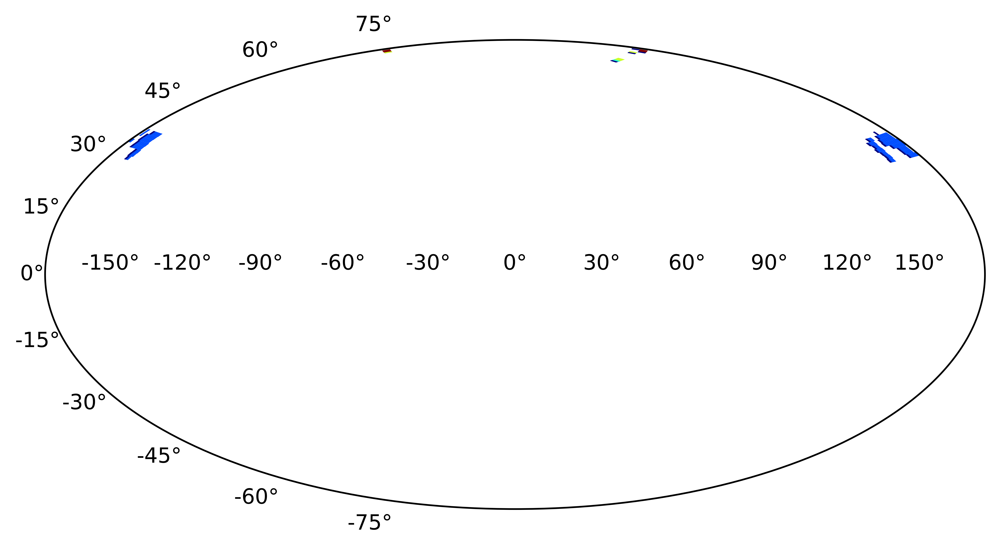

In [128]:
from sqlalchemy import create_engine
sim_path = 'Users/frostig/Desktop/WINTER/Software/WINTER/example_ztf_schedule.db'
#sim_path = 'Users/frostig/Desktop/WINTER/Software/example_ztf_schedule.db'
#sim_path = 'Users/frostig/example_ztf_schedule.db'
engine = create_engine(f'sqlite:////{sim_path}')
df_sim = pd.read_sql('Summary', engine)

print(df.ra1)
print(df.loc[9666])
print(df_sim.fieldID[100], coord.Angle(df_sim.fieldRA[100]*u.rad).degree, coord.Angle(df_sim.fieldDec[100]*u.rad).degree)

# Index is off by 1
# df.loc[fid-1]
field_arr = np.array(df_sim.fieldID)

print(field_arr)
#ra1 = coord.Angle(df.ra1*u.rad)
#ra1 = ra1.wrap_at(wrap*u.degree)
#ra1 = ra1.radian
#ra2 = coord.Angle(df.ra2*u.rad)
#ra2 = ra2.wrap_at(wrap*u.degree)
#ra2 = ra2.radian
#ra3 = coord.Angle(df.ra3*u.rad)
#ra3 = ra3.wrap_at(wrap*u.degree)
#ra3 = ra3.radian
#ra4 = coord.Angle(df.ra4*u.rad)
#ra4 = ra4.wrap_at(wrap*u.degree)
#ra4 = ra4.radian

wrap = 180. 
ra1 = coord.Angle(np.array(df.ra1)* u.deg)
ra1 = ra1.wrap_at(wrap*u.degree).radian
ra2 = coord.Angle(np.array(df.ra2)* u.deg )
ra2 = ra2.wrap_at(wrap*u.degree).radian
ra3 = coord.Angle(np.array(df.ra3)* u.deg )
ra3 = ra3.wrap_at(wrap*u.degree).radian
ra4 = coord.Angle(np.array(df.ra4)* u.deg )
ra4 = ra4.wrap_at(wrap*u.degree).radian
dec1 = coord.Angle(np.array(df.dec1)* u.deg ).radian
dec2 = coord.Angle(np.array(df.dec2)* u.deg ).radian
dec3 = coord.Angle(np.array(df.dec3)* u.deg ).radian
dec4 = coord.Angle(np.array(df.dec4)* u.deg ).radian 

'''new_data = {}
new_data['ra1'] = ra1.radian
new_data['ra2'] = ra2.radian
new_data['ra3'] = ra3.radian
new_data['ra4'] = ra4.radian
new_data['dec1'] = dec1.radian
new_data['dec2'] = dec2.radian
new_data['dec3'] = dec3.radian
new_data['dec4'] = dec4.radian
new_data['field_id'] = np.array(df.index)

new_df = pd.DataFrame(data=new_data, index=data['field_id'], columns=['ra1','dec1','ra2','dec2','ra3','dec3','ra4','dec4'])
mask = (np.abs(new_df.ra1-new_df.ra2)<30*np.pi/180.)
mask = mask & (np.abs(new_df.ra1-new_df.ra3)<30*np.pi/180.) & (np.abs(new_df.ra1-new_df.ra4)<30*np.pi/180.)
new_df = new_df[mask] '''

'''ra1 = coord.Angle(np.array(df.ra1)* u.rad)
ra1 = ra1.wrap_at(wrap*u.degree)
ra2 = coord.Angle(np.array(df.ra2)* u.rad )
ra2 = ra2.wrap_at(wrap*u.degree)
ra3 = coord.Angle(np.array(df.ra3)* u.rad)
ra3 = ra3.wrap_at(wrap*u.degree)
ra4 = coord.Angle(np.array(df.ra4)* u.rad )
ra4 = ra4.wrap_at(wrap*u.degree)
dec1 = coord.Angle(np.array(df.dec1)* u.rad)
dec2 = coord.Angle(np.array(df.dec2)* u.rad )
dec3 = coord.Angle(np.array(df.dec3)* u.rad )
dec4 = coord.Angle(np.array(df.dec4)* u.rad )
print(ra1, type(ra1))
print(ra1.radian, type(ra1)) '''

if plot2:
    fig2 = plt.figure(figsize=(8,6), dpi=1200)
    ax2 = fig2.add_subplot(111, projection="hammer")

    #jet = colors.Colormap('jet')
    jet = plt.get_cmap('jet') 
    cNorm  = colors.Normalize(vmin=0,vmax=5)
    scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)
    #print scalarMap.get_clim()

    for i in field_arr:
        i = i-1
        if (np.abs(ra1[i]-ra2[i])<30*np.pi/180.) & (np.abs(ra1[i]-ra3[i])<30*np.pi/180.) & (np.abs(ra1[i]-ra4[i])<30*np.pi/180.): 
            num_instances = (field_arr == i).sum()
            colorVal = scalarMap.to_rgba(num_instances)
            ax2.fill([ra1[i],ra2[i],ra3[i],ra4[i]],[dec1[i],dec2[i],dec3[i],dec4[i]], fill=True, facecolor=colorVal, edgecolor='none')
        #print [ra1points[i].radian,ra2points[i].radian,ra3points[i].radian,ra4points[i].radian],[dec1points[i].radian,dec2points[i].radian,dec3points[i].radian,dec4points[i].radian]
        #colorVal = scalarMap.to_rgba(i)
        #colorVal = scalarMap.to_rgba(np.random.randint(0,len(ra)))
        #ax2.fill([new_df.ra1[i],new_df.ra2[i],new_df.ra3[i],new_df.ra4[i]],[new_df.dec1[i],new_df.dec2[i],new_df.dec3[i],new_df.dec4[i]], fill=True, facecolor=colorVal, edgecolor='none')
        #ax2.fill([df.ra1[i],df.ra2[i],df.ra3[i],df.ra4[i]],[df.dec1[i],df.dec2[i],df.dec3[i],df.dec[i]], fill=True, facecolor=colorVal, edgecolor='none')
        #ax2.fill([df.ra1[i].radian,df.ra2[i].radian,df.ra3[i].radian,df.ra4[i].radian],[df.dec1[i].radian,df.dec2[i].radian,df.dec3[i].radian,df.dec4[i].radian], fill=True, facecolor=colorVal, edgecolor='none')
        #ax2.fill([ra1[i],ra2[i],ra3[i],ra4[i]],[dec1[i],dec2[i],dec3[i],dec4[i]], fill=True, facecolor=colorVal, edgecolor='none')
        #ax2.fill([ra1[i].radian,ra2[i].radian,ra3[i].radian,ra4[i].radian],[dec1[i].radian,dec2[i].radian,dec3[i].radian,dec4[i].radian], fill=True, facecolor=colorVal, edgecolor='none')
        #ax2.fill([ra1[i].radian,ra2[i].radian,ra3[i].radian,ra4[i].radian],[df.dec1[i],df.dec2[i],df.dec3[i],df.dec4[i]], fill=True, facecolor=colorVal, edgecolor='none')
#observe_gattini.observe(run_name='tmp')
    cbar = mpl.colorbar.ColorbarBase(cax, cmap=jet,norm=cNorm,orientation='vertical',label='# of Visits')

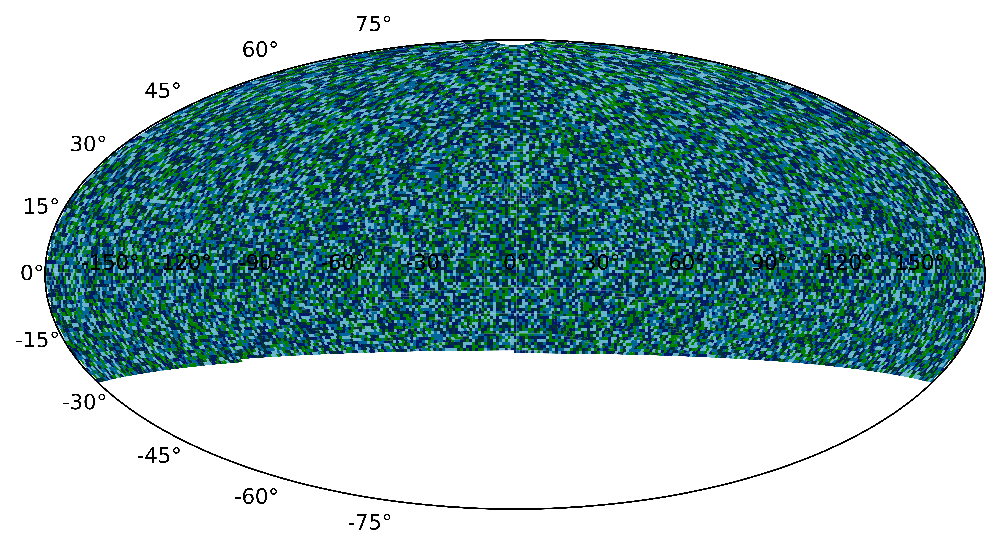

In [145]:
plotfull = 1

wrap = 180. 
ra1 = coord.Angle(np.array(df.ra1)* u.deg)
ra1 = ra1.wrap_at(wrap*u.degree).radian
ra2 = coord.Angle(np.array(df.ra2)* u.deg )
ra2 = ra2.wrap_at(wrap*u.degree).radian
ra3 = coord.Angle(np.array(df.ra3)* u.deg )
ra3 = ra3.wrap_at(wrap*u.degree).radian
ra4 = coord.Angle(np.array(df.ra4)* u.deg )
ra4 = ra4.wrap_at(wrap*u.degree).radian
dec1 = coord.Angle(np.array(df.dec1)* u.deg ).radian
dec2 = coord.Angle(np.array(df.dec2)* u.deg ).radian
dec3 = coord.Angle(np.array(df.dec3)* u.deg ).radian
dec4 = coord.Angle(np.array(df.dec4)* u.deg ).radian 

if plotfull:
    fig2 = plt.figure(figsize=(8,6), dpi=1200)
    ax2 = fig2.add_subplot(111, projection="hammer")

    #jet = colors.Colormap('jet')
    blues = plt.get_cmap('ocean')
    jet = plt.get_cmap('jet') 
    cNorm  = colors.Normalize(vmin=0,vmax=5)
    scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=blues)
    #print scalarMap.get_clim()

    for i in range(30000):
        #i = i-1
        if (np.abs(ra1[i]-ra2[i])<30*np.pi/180.) & (np.abs(ra1[i]-ra3[i])<30*np.pi/180.) & (np.abs(ra1[i]-ra4[i])<30*np.pi/180.): 
            num_instances = np.random.randint(5)
            colorVal = scalarMap.to_rgba(num_instances)
            ax2.fill([ra1[i],ra2[i],ra3[i],ra4[i]],[dec1[i],dec2[i],dec3[i],dec4[i]], fill=True, facecolor=colorVal, edgecolor='none')

In [7]:
#field_id = np.arange(len(ra))
field_id = np.linspace(1,len(ra),len(ra))
entry = np.linspace(0,len(ra)-1,len(ra))
ebv = np.ones(len(ra))
#print(*field_id)
data = {}
data['field_id'] = field_id
data['ra'] = ra.degree
data['dec'] = dec.degree
c = coord.SkyCoord(ra=ra,dec=dec,frame='icrs')
data['l'] = c.galactic.l.degree
data['b'] = c.galactic.b.degree
data['grid_id'] = np.zeros(len(ra), dtype=np.int)
data['eclLon'] = c.geocentricmeanecliptic.lon.degree #geocentricmeanecliptic???
data['eclLat'] = c.geocentricmeanecliptic.lat.degree
data['entry'] = entry
data['ebv'] = ebv

#c.transform_t
#text_df = pd.DataFrame(data=data, index=data['field_id'], columns=['ra','dec','l','b', 'eclLon', 'eclLat','grid_id'])
#text_df = pd.DataFrame(data=data, index=data['field_id'], columns=['ra','dec', 'ebv', 'l','b', 'eclLon', 'eclLat','entry'])

/Users/frostig/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  del sys.path[0]


In [8]:
# SAVE FIELDS

#text_df.to_csv(path_or_buf='../data/WINTER_fields.csv')
#text_df = pd.DataFrame(data=data, index=data['field_id'],
#                       columns=['field_id','ra','dec','l','b', 'eclLon', 'eclLat', 'grid_id'])
#np.savetxt(r'../data/WINTER_fields.txt', text_df, 
#           header=' ID         RA        Dec       Gal Long    Gal Lat    Ecl Long   Ecl Lat     Grid', 
#           fmt='%10.5f')

text_df = pd.DataFrame(data=data, index=data['field_id'],
                       columns=['field_id','ra','dec', 'ebv', 'l','b', 'eclLon', 'eclLat', 'entry'])
np.savetxt('WINTER_fields.txt', text_df, 
           header='ID         RA         Dec       Ebv      Gal Long  Gal Lat    Ecl Long  Ecl Lat   Entry', 
           fmt=['%06d', '%10.5f', '%10.5f', '%1.3f', '%10.5f', '%10.5f','%10.5f', '%10.5f','% 4d'])

0          0.000000
1         60.000000
2        120.000000
3        180.000000
4        240.000000
            ...    
10124    354.155844
10125    355.324675
10126    356.493506
10127    357.662338
10128    358.831169
Name: ra, Length: 10129, dtype: float64 <class 'astropy.units.quantity.Quantity'>


/Users/frostig/opt/anaconda3/lib/python3.7/site-packages/matplotlib/projections/geo.py:414: RuntimeWarning: invalid value encountered in arcsin
  theta = np.arcsin(y / np.sqrt(2))


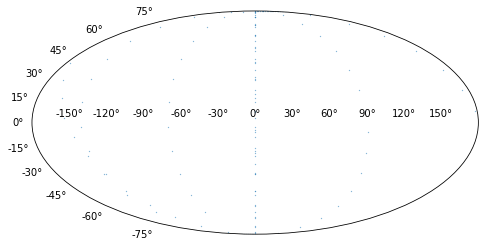

In [94]:
# Plot centers of fields
text_df = text_df[text_df.dec > 30]
print(text_df.ra, type(np.array(text_df.ra)*u.rad))
ra = coord.Angle(np.array(text_df.ra)*u.rad)
dec = coord.Angle(np.array(text_df.dec)*u.rad)
#wrap = 180.
#ra = ra.wrap_at(wrap*u.degree)
ra = ra.radian
dec= dec.radian
fig1 = plt.figure(figsize=(8,6))
ax1 = fig1.add_subplot(111, projection="mollweide")
ax1.scatter(ra, dec, 0.05)

/Users/frostig/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/frostig/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/frostig/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the doc

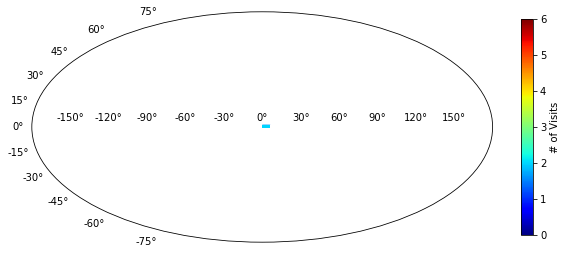

In [95]:
df['counts'] = 0.0
df['last'] = 0.0
#mjdnow = df.expMJD.max()

for i in range(len(df)):
    #givenfield = df[df.index==i]
    #counts = givenfield.count()
    #time_since_last_obs = mjdnow - givenfield.max()
    #print counts, time_since_last_obs
    counts = 2
    if 450 < i < 1000:
        counts = 6
    # time_since_last_obs = np.random.randint(0,100)
    df.at[i,'counts'] = counts
    # df.set_value(i,'last',time_since_last_obs)

def deg2rad(degree):
    return degree*np.pi/180.
cut= df[df.dec > -30]
cut['ra1rad'] = coord.Angle(np.array(cut.ra1)*u.degree).wrap_at(180*u.degree).radian
cut['ra2rad'] = coord.Angle(np.array(cut.ra2)*u.degree).wrap_at(180*u.degree).radian
cut['ra3rad'] = coord.Angle(np.array(cut.ra3)*u.degree).wrap_at(180*u.degree).radian
cut['ra4rad'] = coord.Angle(np.array(cut.ra4)*u.degree).wrap_at(180*u.degree).radian
mask = (np.abs(cut['ra1rad']-cut['ra2rad'])<100*np.pi/180.)
mask = mask & (np.abs(cut['ra1rad']-cut['ra3rad'])<100*np.pi/180.) & (np.abs(cut['ra1rad']-cut['ra4rad'])<100*np.pi/180.)
#print cut['ra1rad'].max(), cut['ra1rad'].min()
cut = cut[mask]
#cut.ra1rad = deg2rad(cut.ra1)
#cut.ra2rad = deg2rad(cut.ra2)
#cut.ra3rad = deg2rad(cut.ra3)
#cut.ra4rad = deg2rad(cut.ra4)
cut.dec1rad = deg2rad(cut.dec1)
cut.dec2rad = deg2rad(cut.dec2)
cut.dec3rad = deg2rad(cut.dec3)
cut.dec4rad = deg2rad(cut.dec4)

logscale = True
projection="mollweide"
jet = plt.get_cmap('jet') 

max_visits = 6
#print('survey duration = %0.1f nights\nMax # of visits = %d' % (ndays,max_visits))
fig = plt.figure(figsize=(8,6))
ax = fig.add_axes([0.05,0.05,0.8,0.8], projection=projection)
cax = fig.add_axes([0.9,0.2,0.02,0.5])
cNorm  = colors.Normalize(vmin=0,vmax=max_visits)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)
for i in range(len(cut)):
    colorVal = scalarMap.to_rgba(df['counts'].values[i])
    ax.fill([cut.ra1rad.values[i],cut.ra2rad.values[i],cut.ra3rad.values[i],cut.ra4rad.values[i]],[cut.dec1rad.values[i],cut.dec2rad.values[i],cut.dec3rad.values[i],cut.dec4rad.values[i]], fill=True, facecolor=colorVal, edgecolor='none')
    #ax.fill([ra1rad[i],ra2rad[i],ra3rad[i],ra4rad[i]],[cut.dec1rad.values[i],cut.dec2rad.values[i],cut.dec3rad.values[i],cut.dec4rad.values[i]], fill=True, facecolor=colorVal, edgecolor='none')
cbar = mpl.colorbar.ColorbarBase(cax, cmap=jet,norm=cNorm,orientation='vertical',label='# of Visits')

In [86]:
df['counts'] = 0.0
df['last'] = 0.0
#mjdnow = df.expMJD.max()

for i in range(len(df)):
    #givenfield = df[df.index==i]
    #counts = givenfield.count()
    #time_since_last_obs = mjdnow - givenfield.max()
    #print counts, time_since_last_obs
    counts = time_since_last_obs = np.random.randint(0,6)
    #if 9000 < i < 10000:
    #    counts = 6
    # time_since_last_obs = np.random.randint(0,100)
    df.set_value(i,'counts',counts)
    # df.set_value(i,'last',time_since_last_obs)

def deg2rad(degree):
    return degree*np.pi/180.
cut= df[df.dec > -30]
#cut= cut[cut.dec < 40]
#cut= cut[cut.ra > 30]
#cut[cut.ra < 40]
cut['ra1rad'] = coord.Angle(cut.ra1*u.degree).wrap_at(180*u.degree).radian
cut['ra2rad'] = coord.Angle(cut.ra2*u.degree).wrap_at(180*u.degree).radian
cut['ra3rad'] = coord.Angle(cut.ra3*u.degree).wrap_at(180*u.degree).radian
cut['ra4rad'] = coord.Angle(cut.ra4*u.degree).wrap_at(180*u.degree).radian
mask = (np.abs(cut['ra1rad']-cut['ra2rad'])<100*np.pi/180.)
mask = mask & (np.abs(cut['ra1rad']-cut['ra3rad'])<100*np.pi/180.) & (np.abs(cut['ra1rad']-cut['ra4rad'])<100*np.pi/180.)
#print cut['ra1rad'].max(), cut['ra1rad'].min()
cut = cut[mask]
#cut.ra1rad = deg2rad(cut.ra1)
#cut.ra2rad = deg2rad(cut.ra2)
#cut.ra3rad = deg2rad(cut.ra3)
#cut.ra4rad = deg2rad(cut.ra4)
cut.dec1rad = deg2rad(cut.dec1)
cut.dec2rad = deg2rad(cut.dec2)
cut.dec3rad = deg2rad(cut.dec3)
cut.dec4rad = deg2rad(cut.dec4)

logscale = True
projection="mollweide"
jet = plt.get_cmap('jet') 

max_visits = 6
#print('survey duration = %0.1f nights\nMax # of visits = %d' % (ndays,max_visits))
fig = plt.figure(figsize=(8,6), dpi=1200)
ax = fig.add_axes([0.05,0.05,0.8,0.8], projection=projection)
cax = fig.add_axes([0.9,0.2,0.02,0.5])
cNorm  = colors.Normalize(vmin=0,vmax=max_visits)
blues = plt.get_cmap('ocean')
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=blues)
for i in range(len(cut)):
    colorVal = scalarMap.to_rgba(df['counts'].values[i])
    ax.fill([cut.ra1rad.values[i],cut.ra2rad.values[i],cut.ra3rad.values[i],cut.ra4rad.values[i]],[cut.dec1rad.values[i],cut.dec2rad.values[i],cut.dec3rad.values[i],cut.dec4rad.values[i]], fill=True, facecolor=colorVal, edgecolor='none')
    #ax.fill([ra1rad[i],ra2rad[i],ra3rad[i],ra4rad[i]],[cut.dec1rad.values[i],cut.dec2rad.values[i],cut.dec3rad.values[i],cut.dec4rad.values[i]], fill=True, facecolor=colorVal, edgecolor='none')
#cbar = mpl.colorbar.ColorbarBase(cax, cmap=jet,norm=cNorm,orientation='vertical',label='# of Visits')

AttributeError: 'DataFrame' object has no attribute 'set_value'

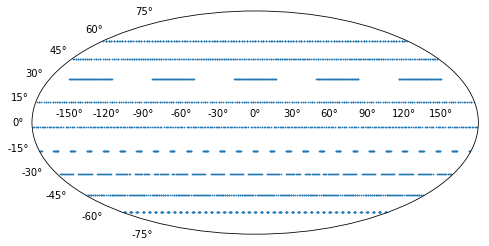

In [45]:
df = df[df.dec > 30]
#df = df[df.dec < 40]



ra = coord.Angle(df.ra*u.rad)
wrap = 180.
ra = ra.wrap_at(wrap*u.degree)
ra = ra.radian
fig1 = plt.figure(figsize=(8,6))
ax1 = fig1.add_subplot(111, projection="mollweide")
ax1.scatter(ra, df.dec, 0.5)